<b>This Jupyter Notebook aims to fulfil the following:</b>
<br>1) Import human connectome matrices of varying age groups
<br>2) Perform community detection using a weighted stochastic block model (WSBM) formulation
<br>3) Measure the differences in community structure using variation of information (VI).

# Importing

## Libraries

In [425]:
#Basic data manipulation and visualisation libraries
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import glob
import math

#Network Libraries
import networkx as nx
from nxviz import CircosPlot
from community import community_louvain

#Magic command to load watermark
%load_ext watermark

#Remove warnings
import warnings
warnings.filterwarnings('ignore') 

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark


In [48]:
#Display library versions
%watermark --author "Rory Burke" --date --time --python --machine --iversion --watermark --packages community_louvain,meshio,plotly,scipy,scikit-learn,jupyterlab,notebook

Author: Rory Burke

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

community_louvain: not installed
meshio           : 5.3.4
plotly           : 5.7.0
scipy            : 1.7.1
scikit-learn     : 0.24.2
jupyterlab       : 3.2.1
notebook         : 6.4.5

Compiler    : MSC v.1916 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 142 Stepping 12, GenuineIntel
CPU cores   : 8
Architecture: 64bit

pandas    : 1.3.4
networkx  : 2.6.3
seaborn   : 0.11.2
json      : 2.0.9
numpy     : 1.20.3
matplotlib: 3.4.3

Watermark: 2.3.0



## Connectivity Matrices

Here we import the connectivity matrices from the '811_Functional_Connectomes' folder (this was originally called 1000_Functional_Connectomes, but the folder only contains 811 files). In particular, we seek connectivity matrices that correspond to certain age groups. Since there are 881 matrices, selecting these by hand would be intractable, so we build some code that obtains the appropriate matrices.

In [410]:
#Note the number of functional connectomes in the folder
num_connectomes = 811

In [411]:
#Open the age list and strip away the new line for each age
age_list = [line.rstrip('\n') for line in open('811_Functional_Connectomes/age_list.txt')]

In [412]:
#Convert this into a list of floats, not strings
age_list = [float(i) for i in age_list]

In [413]:
#Truncate the age_list to that of the real number of matrices
age_list = age_list[0:num_connectomes-1]

### Young Participants

We classify young participants as being 20-25 years of age inclusive.

In [423]:
young_indices = [i for i, age in enumerate(age_list) if 20 <= age <= 25]
len(young_indices)

500

Here we obtain the matrices of the young individuals

In [106]:
#List all files for the connectivity matrices
all_files = glob.glob(
    './811_Functional_Connectomes/Connectivity matrices/*_matrix_file.txt')

#Empty matrix lists
young_matrices = []

#Importing all 'young' matrices to generate averaged data with Numpy
for idx in young_indices:
    young_matrices.append(np.genfromtxt(all_files[idx]))

Now we average across all such matrices

In [107]:
mat = np.zeros(shape=young_matrices[0].shape)

for matrix in young_matrices:
    mat += matrix
    
young_matrix_avg = mat/len(young_matrices)

Save this result:

In [159]:
np.savetxt(
    './811_Functional_Connectomes/Averaged connectivity matrices/young_matrix_avg.txt',
    young_matrix_avg)

Load this result:

In [3]:
y_matrix = np.genfromtxt(
    './811_Functional_Connectomes/Averaged connectivity matrices/young_matrix_avg.txt'
)

### Mid-Aged Participants

We classify middle-aged participants as being 45-55 years of age inclusive.

In [422]:
mid_indices = [i for i, age in enumerate(age_list) if 45 <= age <= 55]
len(mid_indices)

30

Here we obtain the matrices of the middle-aged individuals

In [115]:
#List all files for the connectivity matrices
all_files = glob.glob(
    './811_Functional_Connectomes/Connectivity matrices/*_matrix_file.txt')

#Empty matrix lists
mid_matrices = []

#Importing all 'young' matrices to generate averaged data with Numpy
for idx in mid_indices:
    mid_matrices.append(np.genfromtxt(all_files[idx]))

Now we average across all such matrices

In [116]:
mat = np.zeros(shape=mid_matrices[0].shape)

for matrix in mid_matrices:
    mat += matrix
    
mid_matrix_avg = mat/len(mid_matrices)

Save this result:

In [155]:
np.savetxt(
    './811_Functional_Connectomes/Averaged connectivity matrices/mid_matrix_avg.txt',
    mid_matrix_avg)

Load this result:

In [4]:
m_matrix = np.genfromtxt(
    './811_Functional_Connectomes/Averaged connectivity matrices/mid_matrix_avg.txt'
)

### Old Participants

We classify old participants as being 70 years of age or higher.

In [421]:
old_indices = [i for i, age in enumerate(age_list) if 70 <= age]
len(old_indices)

16

Here we obtain the matrices of the old individuals

In [118]:
#List all files for the connectivity matrices
all_files = glob.glob(
    './811_Functional_Connectomes/Connectivity matrices/*_matrix_file.txt')

#Empty matrix lists
old_matrices = []

#Importing all 'young' matrices to generate averaged data with Numpy
for idx in old_indices:
    old_matrices.append(np.genfromtxt(all_files[idx]))

Now we average across all such matrices

In [119]:
mat = np.zeros(shape=old_matrices[0].shape)

for matrix in old_matrices:
    mat += matrix
    
old_matrix_avg = mat/len(old_matrices)

Save this result:

In [153]:
np.savetxt(
    './811_Functional_Connectomes/Averaged connectivity matrices/old_matrix_avg.txt',
    old_matrix_avg)

Load this result:

In [5]:
o_matrix = np.genfromtxt(
    './811_Functional_Connectomes/Averaged connectivity matrices/old_matrix_avg.txt'
)

## Metadata

We obtain the region names and other subnetwork information

In [6]:
#Obtaining name of areas according to matching file
lineList = [
    line.rstrip('\n') for line in open(
        './811_Functional_Connectomes/Region Names/Baltimore_5560_region_names_abbrev_file.txt'
    )
]

#Obtaining a random list of numbers to simulate subnetworks -- THESE NUMBERS DO NOT CORRESPOND TO ANY REAL CLASSIFICATION
sublist = [line.rstrip('\n') for line in open('./subnet_ordernames.txt')]

#Obtaining a random list of colors that will match the random subnetwork classification for further graphs -- THESE COLORNAMES DO NOT CORRESPOND TO ANY REAL CLASSIFICATION
colorlist = [line.rstrip('\n') for line in open('./subnet_order_colors.txt')]

#Obtaining a random list of colors (in numbers) that will match the random subnetwork classification for further graphs -- THESE NUMBERS DO NOT CORRESPOND TO ANY REAL CLASSIFICATION
colornumbs = np.genfromtxt('./subnet_colors_number.txt')

# Visualisation 

## Heat Map

We now visualise the matrices using a heatmap via the Seaborn package.

In [428]:
plt.rc('axes', titlesize=24)

### Young Participants

In [123]:
#Creating a DataFrame which will have the rows and column names according to the brain areas
y_matrix_diag_NaN = young_matrix_avg.copy()
np.fill_diagonal(y_matrix_diag_NaN, np.nan)
y_Pd_matrix = pd.DataFrame(y_matrix_diag_NaN)
y_Pd_matrix.columns = lineList
y_Pd_matrix.index = lineList
y_Pd_matrix = y_Pd_matrix.sort_index(0).sort_index(1)

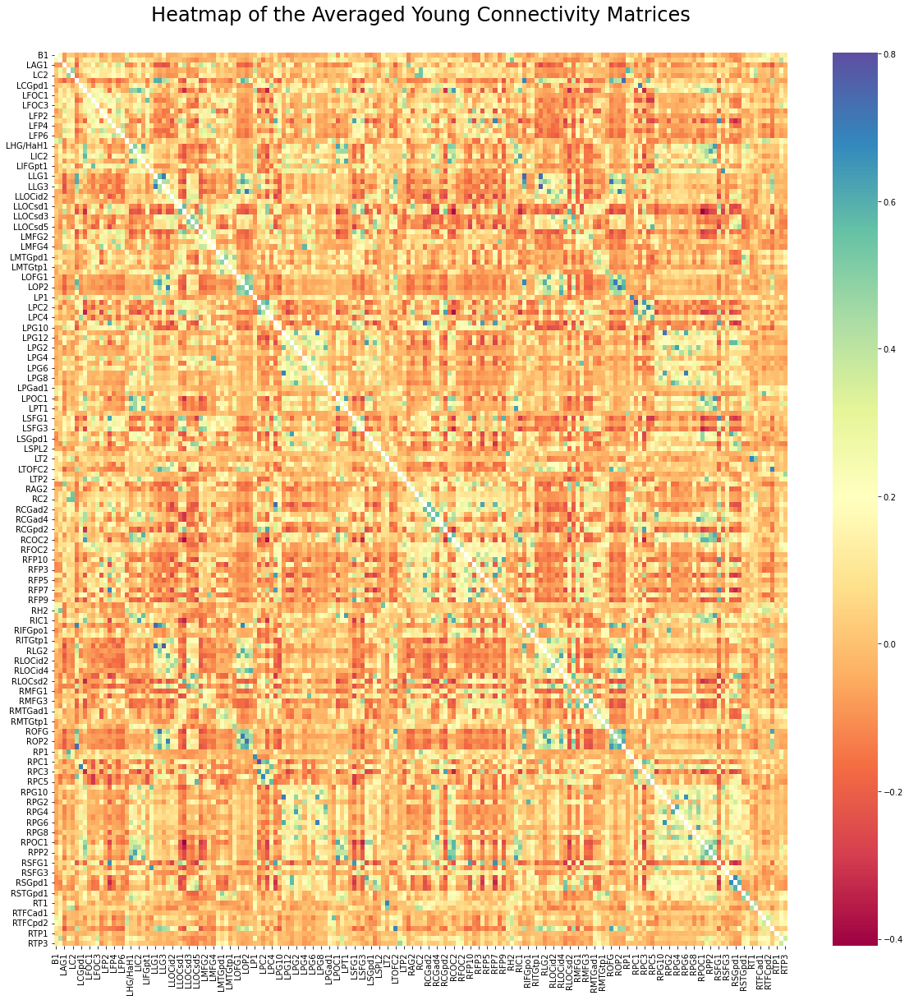

In [140]:
#This mask variable gives you the possibility to plot only half of the correlation matrix.
mask = np.zeros_like(y_Pd_matrix.values, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20,20))
_ = sns.heatmap(y_Pd_matrix,
                cmap='Spectral',
                cbar=True,
                square=False,
                mask=None)  #To apply the mask, change to mask=mask

plt.title('Heatmap of the Averaged Young Connectivity Matrices', y=1.03)
plt.savefig('./Figures/young_avg_heatmap.pdf', format='pdf')

### Mid-Aged Participants

In [141]:
#Creating a DataFrame which will have the rows and column names according to the brain areas
m_matrix_diag_NaN = mid_matrix_avg.copy()
np.fill_diagonal(m_matrix_diag_NaN, np.nan)
m_Pd_matrix = pd.DataFrame(m_matrix_diag_NaN)
m_Pd_matrix.columns = lineList
m_Pd_matrix.index = lineList
m_Pd_matrix = m_Pd_matrix.sort_index(0).sort_index(1)

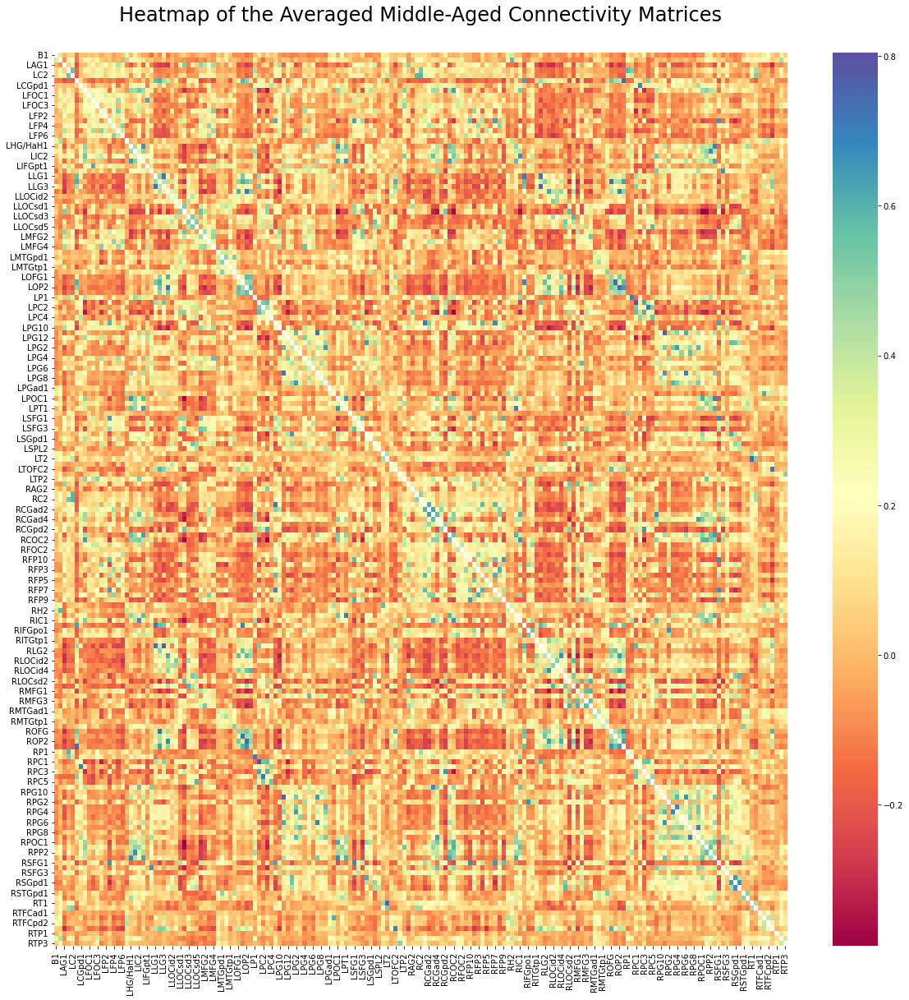

In [142]:
#This mask variable gives you the possibility to plot only half of the correlation matrix.
mask = np.zeros_like(m_Pd_matrix.values, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20,20))
_ = sns.heatmap(m_Pd_matrix,
                cmap='Spectral',
                cbar=True,
                square=False,
                mask=None)  #To apply the mask, change to mask=mask

plt.title('Heatmap of the Averaged Middle-Aged Connectivity Matrices', y=1.03)
plt.savefig('./Figures/mid_avg_heatmap.pdf', format='pdf')

### Old Participants

In [143]:
#Creating a DataFrame which will have the rows and column names according to the brain areas
o_matrix_diag_NaN = old_matrix_avg.copy()
np.fill_diagonal(o_matrix_diag_NaN, np.nan)
o_Pd_matrix = pd.DataFrame(o_matrix_diag_NaN)
o_Pd_matrix.columns = lineList
o_Pd_matrix.index = lineList
o_Pd_matrix = o_Pd_matrix.sort_index(0).sort_index(1)

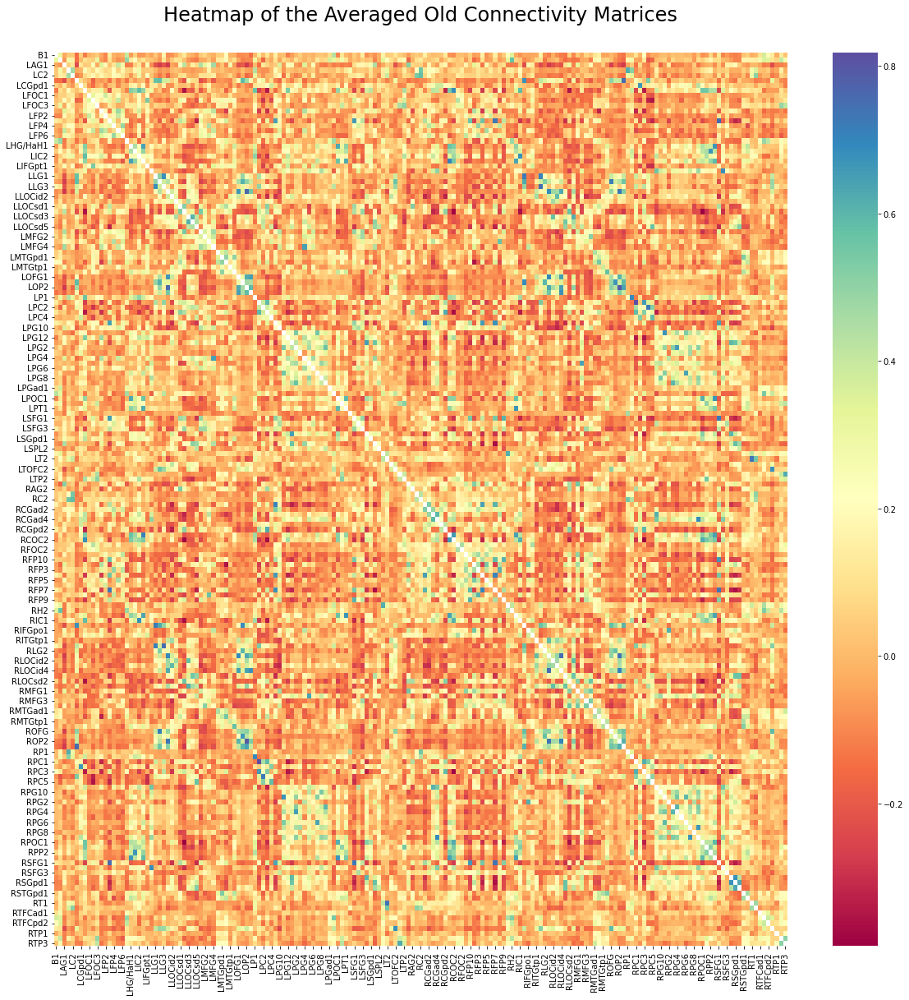

In [144]:
#This mask variable gives you the possibility to plot only half of the correlation matrix.
mask = np.zeros_like(o_Pd_matrix.values, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20,20))
_ = sns.heatmap(o_Pd_matrix,
                cmap='Spectral',
                cbar=True,
                square=False,
                mask=None)  #To apply the mask, change to mask=mask

plt.title('Heatmap of the Averaged Old Connectivity Matrices', y=1.03)
plt.savefig('./Figures/old_avg_heatmap.pdf', format='pdf')

<b>Immediate conclusions</b>:
- All heatmaps look similar, with some marginal differences if one squints their eye.
- All averaged connectivity matrices have positive edge weights; this is likely a consequence of the edge weights taken as the magnitude of the correlation. Does this mean we must assume all connections are positive feedback?

## Edge Weight Distribution

This serves as another visualisation tool for each age group.

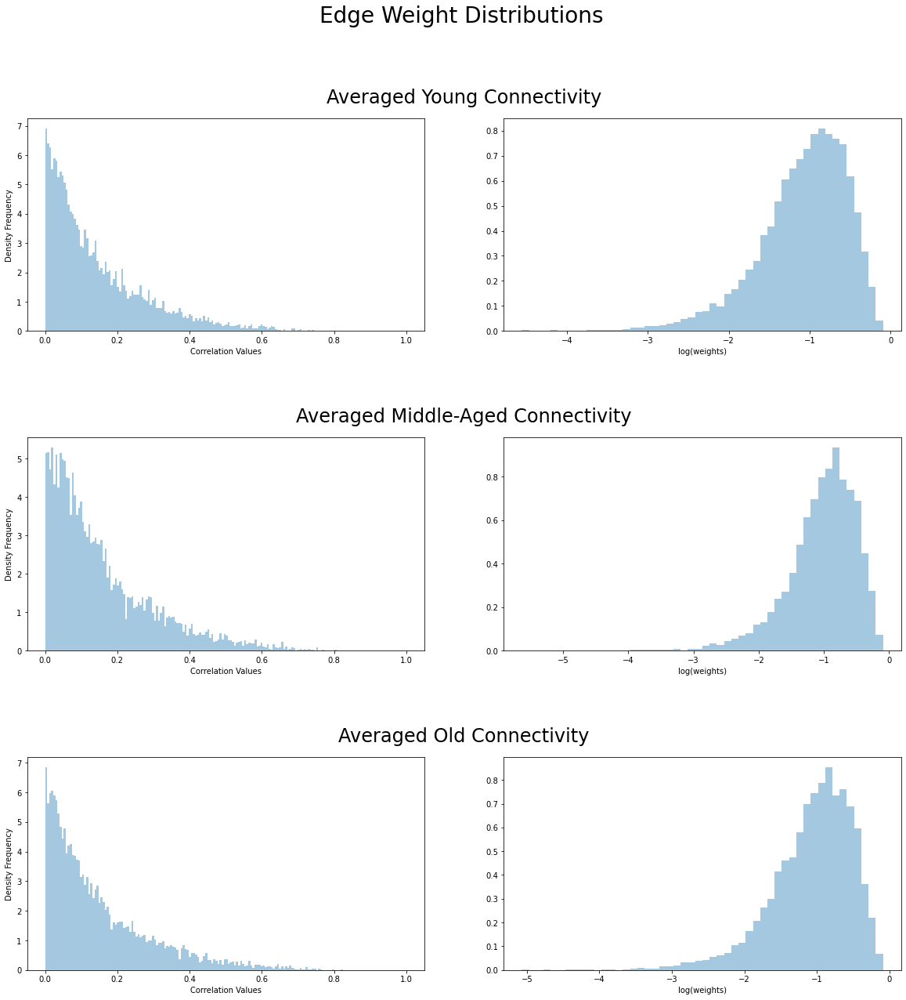

In [211]:
plt.figure(1, figsize=(20, 20))

plt.suptitle('Edge Weight Distributions', fontsize=28, x=0.51)

################################################

#Young participants:

#Weight distribution plot
bins = np.arange(np.sqrt(len(np.concatenate(y_matrix))))
bins = (bins - np.min(bins)) / np.ptp(bins)

plt.subplot(3, 2, 1)
#Distribution of raw weights
rawdist = sns.distplot(y_matrix_diag_NaN.flatten(),
                       bins=bins,
                       kde=False,
                       norm_hist=True)
rawdist.set(xlabel='Correlation Values', ylabel='Density Frequency')
plt.title('Averaged Young Connectivity', x=1.1, y=1.05)

plt.subplot(3, 2, 2)
#Probability density of log10
log10dist = sns.distplot(np.log10(y_matrix_diag_NaN).flatten(),
                         kde=False,
                         norm_hist=True)
log10dist.set(xlabel='log(weights)')

################################################

#Mid-aged participants:

#Weight distribution plot
bins = np.arange(np.sqrt(len(np.concatenate(m_matrix))))
bins = (bins - np.min(bins)) / np.ptp(bins)

plt.subplot(3, 2, 3)
#Distribution of raw weights
rawdist = sns.distplot(m_matrix_diag_NaN.flatten(),
                       bins=bins,
                       kde=False,
                       norm_hist=True)
rawdist.set(xlabel='Correlation Values', ylabel='Density Frequency')
plt.title('Averaged Middle-Aged Connectivity', x=1.1, y=1.05)

plt.subplot(3, 2, 4)
#Probability density of log10
log10dist = sns.distplot(np.log10(m_matrix_diag_NaN).flatten(),
                         kde=False,
                         norm_hist=True)
log10dist.set(xlabel='log(weights)')

################################################

#Old participants:

#Weight distribution plot
bins = np.arange(np.sqrt(len(np.concatenate(o_matrix))))
bins = (bins - np.min(bins)) / np.ptp(bins)

plt.subplot(3, 2, 5)
#Distribution of raw weights
rawdist = sns.distplot(o_matrix_diag_NaN.flatten(),
                       bins=bins,
                       kde=False,
                       norm_hist=True)
rawdist.set(xlabel='Correlation Values', ylabel='Density Frequency')
plt.title('Averaged Old Connectivity', x=1.1, y=1.05)

plt.subplot(3, 2, 6)
#Probability density of log10
log10dist = sns.distplot(np.log10(o_matrix_diag_NaN).flatten(),
                         kde=False,
                         norm_hist=True)
log10dist.set(xlabel='log(weights)')

plt.subplots_adjust(hspace=0.5)

plt.savefig('./Figures/edge_weight_dists.pdf', format='pdf')

## Graphs

Based on the work proceeding, it was found that one network measure that well separates the age brackets is the strength of the connections, since it showed clearly that the old age bracket had weaker connections on average.

### Converting the Matrices into Graphs

We will not visualise the graph induced by the adjacency matrices because they are simply too large to visualise in this manner.

In [205]:
#Creating the graphs
yG = nx.from_numpy_matrix(y_matrix)
mG = nx.from_numpy_matrix(m_matrix)
oG = nx.from_numpy_matrix(o_matrix)

#Removing any self-loops
yG.remove_edges_from(list(nx.selfloop_edges(yG)))
mG.remove_edges_from(list(nx.selfloop_edges(mG)))
oG.remove_edges_from(list(nx.selfloop_edges(oG)))

We create a function that converts the brain metadata into a dictionary, so this can be used in the network visualisation.

In [291]:
#Our converter function
def Convert(lst): 
    res_dct = {i : lst[i] for i in range(0, len(lst))} 
    return res_dct

#Add brain areas as attribute of nodes
nx.set_node_attributes(yG, Convert(lineList), 'area')
nx.set_node_attributes(mG, Convert(lineList), 'area')
nx.set_node_attributes(oG, Convert(lineList), 'area')

#Add node colors
nx.set_node_attributes(yG, Convert(colorlist), 'color')
nx.set_node_attributes(mG, Convert(colorlist), 'color')
nx.set_node_attributes(oG, Convert(colorlist), 'color')

#Add subnetwork attribute
nx.set_node_attributes(yG, Convert(sublist), 'subnet')
nx.set_node_attributes(mG, Convert(sublist), 'subnet')
nx.set_node_attributes(oG, Convert(sublist), 'subnet')

#Add node color numbers
nx.set_node_attributes(yG, Convert(colornumbs), 'colornumb')
nx.set_node_attributes(mG, Convert(colornumbs), 'colornumb')
nx.set_node_attributes(oG, Convert(colornumbs), 'colornumb')

### Young Graph

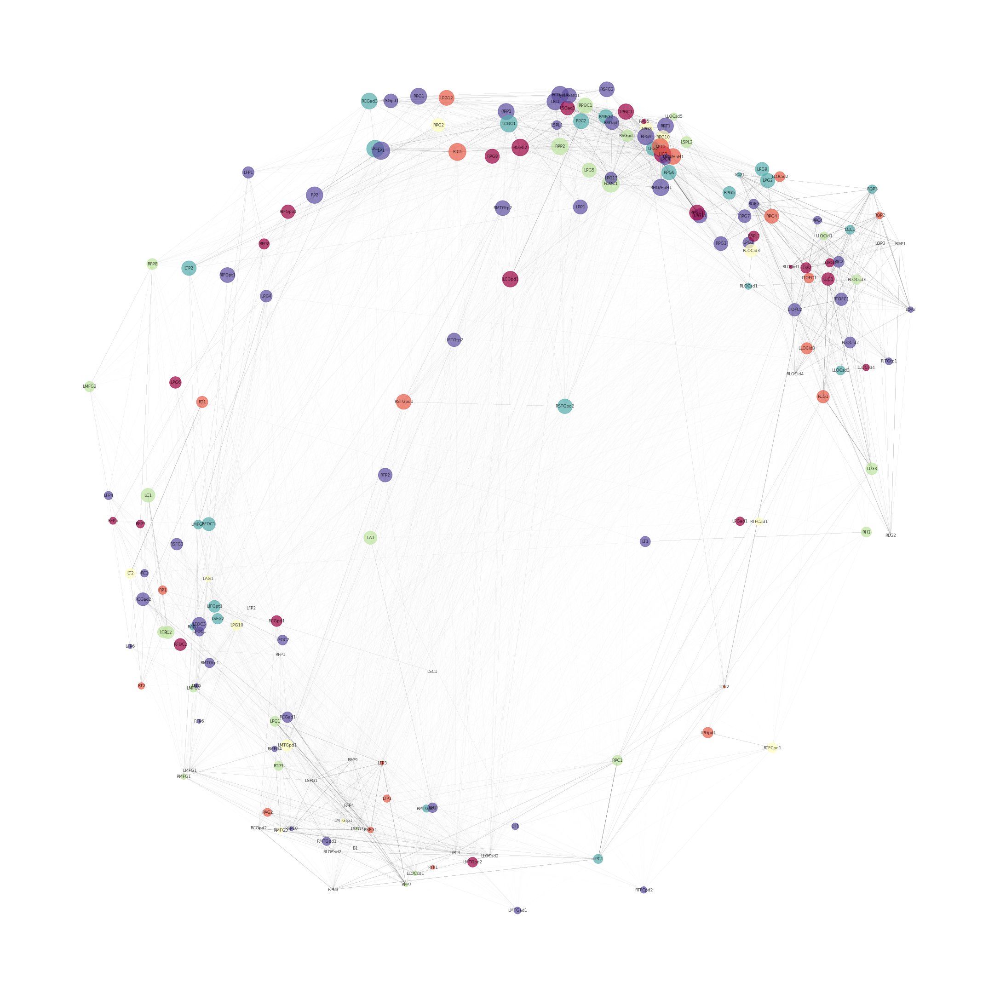

In [300]:
plt.figure(figsize=(30, 30))
edgewidth = [d['weight'] for (u, v, d) in yG.edges(data=True)]
pos = nx.spring_layout(yG, scale=5)
nx.draw(yG,
        pos,
        with_labels=True,
        width=np.power(edgewidth, 3),
        edge_color='black',
        node_size=mean_strength_calculator(yG)[1] * 20000,
        labels=Convert(lineList),
        font_color='black',
        node_color=colornumbs / 10,
        cmap=plt.cm.Spectral,
        alpha=0.7,
        font_size=9)

plt.savefig('./Figures/y_graph.pdf', format='pdf')

### Mid-Aged Graph

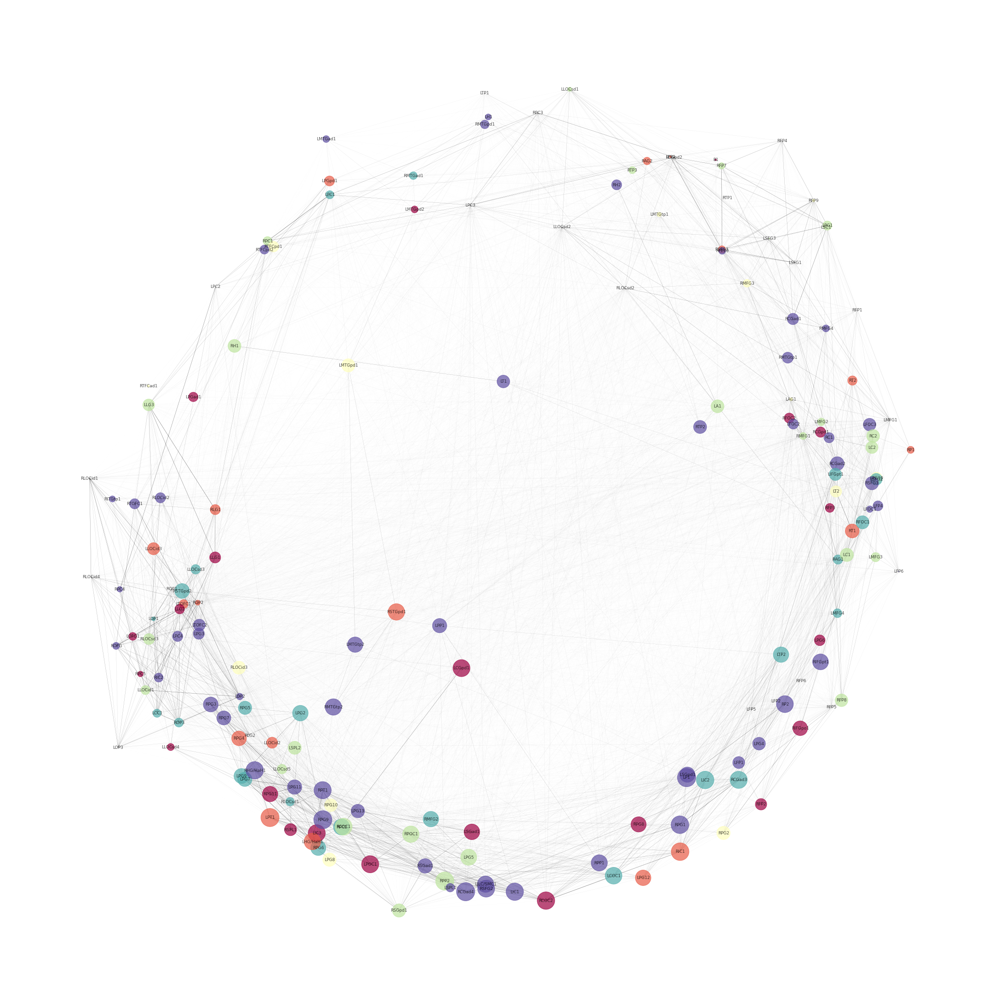

In [301]:
plt.figure(figsize=(30, 30))
edgewidth = [d['weight'] for (u, v, d) in mG.edges(data=True)]
pos = nx.spring_layout(mG, scale=5)
nx.draw(mG,
        pos,
        with_labels=True,
        width=np.power(edgewidth, 3),
        edge_color='black',
        node_size=mean_strength_calculator(mG)[1] * 20000,
        labels=Convert(lineList),
        font_color='black',
        node_color=colornumbs / 10,
        cmap=plt.cm.Spectral,
        alpha=0.7,
        font_size=9)

plt.savefig('./Figures/m_graph.pdf', format='pdf')

### Old Graph

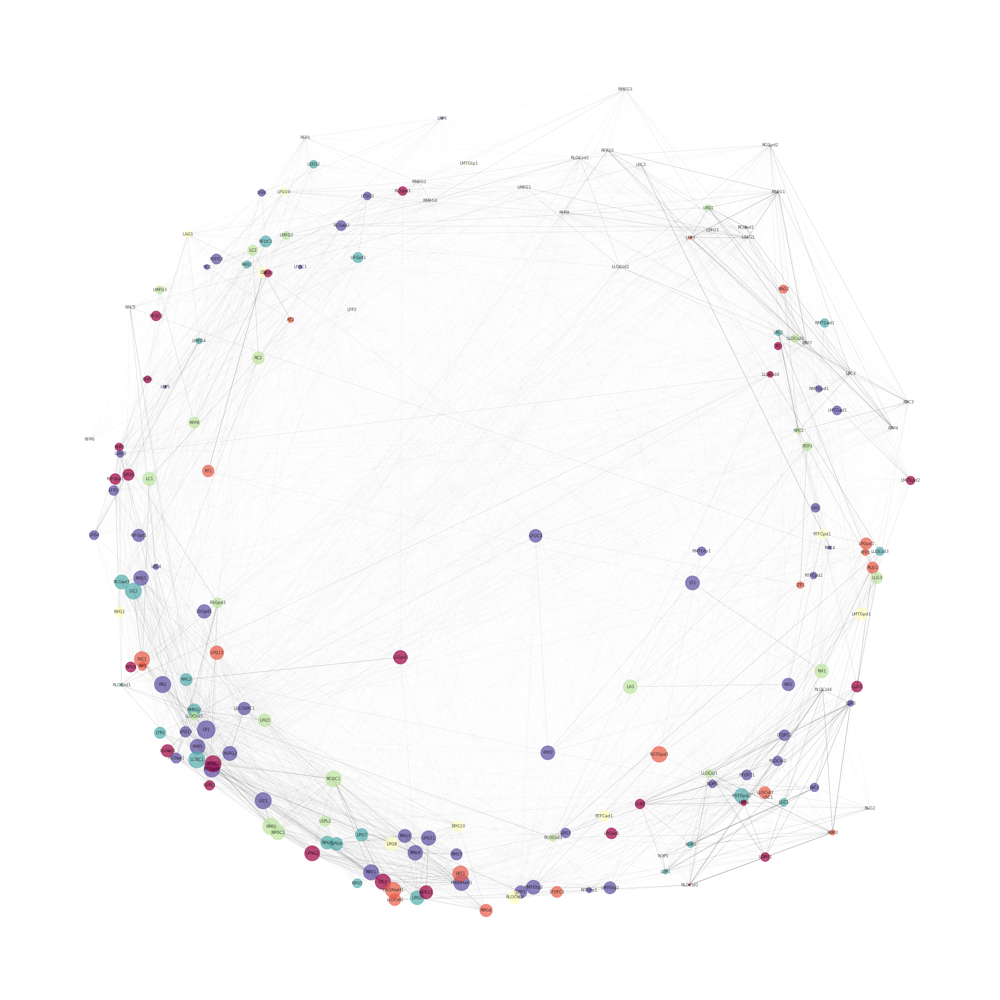

In [302]:
plt.figure(figsize=(30, 30))
edgewidth = [d['weight'] for (u, v, d) in oG.edges(data=True)]
pos = nx.spring_layout(oG, scale=5)
nx.draw(oG,
        pos,
        with_labels=True,
        width=np.power(edgewidth, 3),
        edge_color='black',
        node_size=mean_strength_calculator(oG)[1] * 20000,
        labels=Convert(lineList),
        font_color='black',
        node_color=colornumbs / 10,
        cmap=plt.cm.Spectral,
        alpha=0.7,
        font_size=9)

plt.savefig('./Figures/o_graph.pdf', format='pdf')

No inference can be made from these displayed graphs; they serve as a general visualisation of the connected regions of the brain only.

# Network Measures

We use some well-known network measures to establish additional differences between the connectivity matrices. These are:
- Density
- Strength (the weighted equivalent of degree)
- Centrality: betweenness, closeness
- Clustering coeffcient
- Path length
- Modularity
- Assortativity

<br>Some network measures have prerequisites. The assumption is that our network is not fragmentmented, which would prohibit measures such as closeness centrality and the average shortest path.

## Density $\rho$

The density of a graph is given by the following:
$$ \rho_G = \frac{M}{\frac{1}{2}{N \choose 2}}$$
where $M$ is the number of true edges and $N$ is the total number of nodes.

Of course, if the graph is fully connected, albeit with weak connections, then this density is 1 automatically. We show this below. For this reason, we make the graphs sparser by setting different thresholds to remove weak connections, and then assess the density from there.

In [184]:
def density_calculator(matrix, G):

    #Create copies of the graphs which can be made sparser
    matrix_sparser1 = matrix.copy()
    matrix_sparser2 = matrix.copy()

    #Create sparser graphs, by setting a threshold for the minimum correlation value between nodes.
    #We look at a threshold of 0.5 and 0.75.
    matrix_sparser1[matrix_sparser1 <= 0.50] = 0
    matrix_sparser2[matrix_sparser2 <= 0.75] = 0

    #Turn these adjacency matrices into graphs
    G_half = nx.from_numpy_matrix(matrix_sparser1)
    G_quarter = nx.from_numpy_matrix(matrix_sparser2)

    #Remove self loops just like we did before
    G_half.remove_edges_from(list(nx.selfloop_edges(G_half)))
    G_quarter.remove_edges_from(list(nx.selfloop_edges(G_quarter)))

    #Compute the associated densities of each graph
    all_connections = nx.density(G)
    half_connections = nx.density(G_half)
    quarter_connections = nx.density(G_quarter)
    
    #Return the density values
    names = ['>0', '> 0.5', '> 0.75']
    values = [all_connections, half_connections, quarter_connections]

    return dict(zip(names, values))

In [185]:
young_densities = density_calculator(y_matrix, yG)
young_densities

{'>0': 1.0, '> 0.5': 0.013161273754494093, '> 0.75': 0.00012840267077555214}

In [186]:
mid_densities = density_calculator(m_matrix, mG)
mid_densities

{'>0': 1.0, '> 0.5': 0.01611453518233179, '> 0.75': 0.0003852080123266564}

In [187]:
old_densities = density_calculator(o_matrix, oG)
old_densities

{'>0': 1.0, '> 0.5': 0.015921931176168466, '> 0.75': 0.0003210066769388803}

<b>Conclusions</b>:
- All connectivity matrices are fully connected, as all have $\rho = 1$
- Middle-aged connectivity matrices have stronger connections on average
- Young and old connectivity matrices have weaker connections, with young having the weakest on average.

## Mean Strength $\langle k \rangle$

The mean strength of a graph is given by:
$$ \langle k \rangle_G = \frac{1}{N}\sum_{i=1}^{N} \left(\frac{1}{N-1}\sum_{j\neq i}w_{ij}\right)$$
where $w_{ij}$ is the undirected strength from $i \rightarrow j$, and the division by $N-1$ is because every node $i$ has $N-1$ other nodes $j$ in the graph to connect to.

I anticipate this measure will not be that informative; despite the different generations of brains having different connections, their overall average connection strength will probably be the same (perhaps slightly weaker for older individuals on average).

In [283]:
def mean_strength_calculator(G):
    #Calculate the strength of each node
    strength = G.degree(weight='weight')
    strengths = {node: val for (node, val) in strength}
    
    #Associate the strengths and normalised strengths to each node as an attribute, which can
    #used later if wanted
    nx.set_node_attributes(G, dict(strength), 'strength')
    normed_strenghts = {node: val * 1/(len(G.nodes)-1) for (node, val) in strength}
    nx.set_node_attributes(G, normed_strenghts, 'strength_normed')
    
    #Compute this average strength of a connection to a given node $i$, and store
    #this in a Numpy array
    normalised_strength_list = np.array([val * 1/(len(G.nodes)-1) for (node, val) in strength])
    
    #Divide this result by the number of nodes N
    mean_strength = np.sum(normalised_strength_list)/len(G.nodes)
    
    #Return the result
    return mean_strength, normalised_strength_list

In [284]:
young_mean_strength = mean_strength_calculator(yG)[0]
young_mean_strength

0.02868253163156476

In [285]:
mid_mean_strength = mean_strength_calculator(mG)[0]
mid_mean_strength

0.029837080679202068

In [286]:
old_mean_strength = mean_strength_calculator(oG)[0]
old_mean_strength

0.023304602742699323

<b>Conclusions</b>: 
- The older age groups have a weaker average connection strength, which is somewhat expected
- The middle-aged groups have a slightly stronger average connection strength compared to the younger groups, which may suggest that connections are strengthened with experience but also deteriate with age.

## Centralities

### Clustering Coefficient Distribution

Clustering coefficient $C_G$, defined as:
$$ C_i := \frac{\text{Number of triangles including the $i^{\text{th}}$ node}}{k_i(k_i-1)/2}$$
where $k_i$ is the total strength of connections to node $i$: $k_i = \sum_{j\neq i}w_{ij}$.

Thismeasures a tendency of any two neighbours of a node to be directly connected, thus forming a triangle shape.

In [210]:
#Calculate the clustering coefficient distributions
y_cc = nx.clustering(yG, weight='weight')
m_cc = nx.clustering(mG, weight='weight')
o_cc = nx.clustering(oG, weight='weight')

#Add as attribute to the nodes, so it can potentially be used later for visualisation
nx.set_node_attributes(yG, y_cc, 'cc')
nx.set_node_attributes(mG, m_cc, 'cc')
nx.set_node_attributes(oG, o_cc, 'cc')

We create a normalised histogram to represent the distributions of the clustering coefficients.

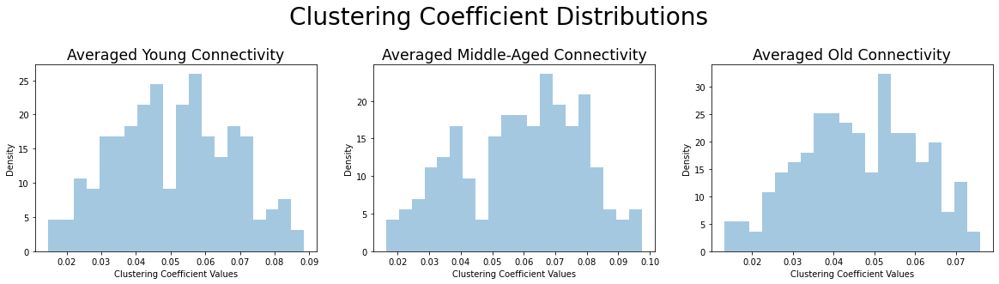

In [229]:
plt.figure(2, figsize=(20, 4))

plt.suptitle('Clustering Coefficient Distributions', fontsize=28, y=1.12)

################################################

#Young participants:
plt.subplot(1, 3, 1)

sns.distplot(list(y_cc.values()), kde=False, norm_hist=True, bins=20)
plt.xlabel('Clustering Coefficient Values')
plt.ylabel('Density')
plt.title('Averaged Young Connectivity', fontsize='xx-large')

################################################

#Mid-aged participants:
plt.subplot(1, 3, 2)

sns.distplot(list(m_cc.values()), kde=False, norm_hist=True, bins=20)
plt.xlabel('Clustering Coefficient Values')
plt.ylabel('Density')
plt.title('Averaged Middle-Aged Connectivity', fontsize='xx-large')

################################################

#Old participants:
plt.subplot(1, 3, 3)

sns.distplot(list(o_cc.values()), kde=False, norm_hist=True, bins=20)
plt.xlabel('Clustering Coefficient Values')
plt.ylabel('Density')
plt.title('Averaged Old Connectivity', fontsize='xx-large')

plt.savefig('./Figures/cc_dists.pdf', format='pdf')

<b>Conclusion</b>: The middle-aged density is more skewed to higher values than the other age groups, suggesting a stronger connection between groups (triangles) of nodes.

### Betweenness Centrality Distribution

This is best defined in words, since it is already implemented in NetworkX: betweenness$_i$ = the fraction of shortest paths passing through node $i$ out of all shortest paths in the graph.

In [230]:
#Calculate the betweenness centrality distributions
y_bc = nx.betweenness_centrality(yG, weight='weight')
m_bc = nx.betweenness_centrality(mG, weight='weight')
o_bc = nx.betweenness_centrality(oG, weight='weight')

#Add as attribute to the nodes, so it can potentially be used later for visualisation
nx.set_node_attributes(yG, y_bc, 'bc')
nx.set_node_attributes(mG, m_bc, 'cc')
nx.set_node_attributes(oG, o_bc, 'cc')

We create a normalised histogram to represent the distributions of the betweenness centralities.

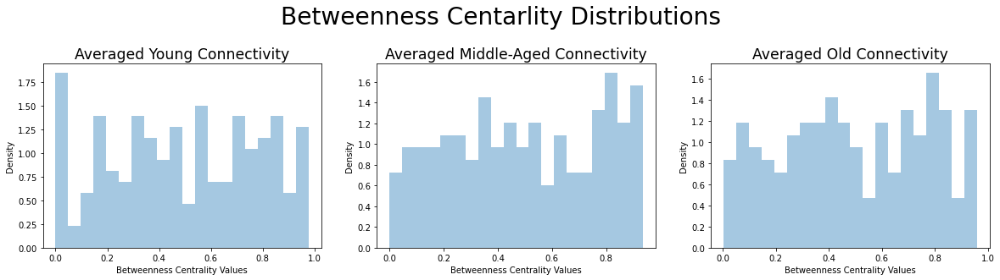

In [231]:
plt.figure(3, figsize=(20, 4))

plt.suptitle('Betweenness Centarlity Distributions', fontsize=28, y=1.12)

################################################

#Young participants:
plt.subplot(1, 3, 1)

sns.distplot(list(y_bc.values()), kde=False, norm_hist=True, bins=20)
plt.xlabel('Betweenness Centrality Values')
plt.ylabel('Density')
plt.title('Averaged Young Connectivity', fontsize='xx-large')

################################################

#Mid-aged participants:
plt.subplot(1, 3, 2)

sns.distplot(list(m_bc.values()), kde=False, norm_hist=True, bins=20)
plt.xlabel('Betweenness Centrality Values')
plt.ylabel('Density')
plt.title('Averaged Middle-Aged Connectivity', fontsize='xx-large')

################################################

#Old participants:
plt.subplot(1, 3, 3)

sns.distplot(list(o_bc.values()), kde=False, norm_hist=True, bins=20)
plt.xlabel('Betweenness Centrality Values')
plt.ylabel('Density')
plt.title('Averaged Old Connectivity', fontsize='xx-large')

plt.savefig('./Figures/bc_dists.pdf', format='pdf')

### Closeness Centrality Distributions

This is defined as:
$$ \text{closeness}_i := \left( \frac{1}{N-1}\sum_{j\neq i} d(v_i, v_j) \right)^{-1} $$
where $d$ is the geodesic distance. Hence, it is the inverse of the average geodesic distance from node $i$.

Now, to make this measure to be non-trivial in a weighted context, we can change the notion of distance based upon these edge weights. We do this by setting the distance to be the inverse of the correlation value, since more highly correlated nodes are seen as closer.

In [237]:
#The distance functions for each network
yG_distance_dict = {(e1, e2): 1 / abs(weight) for e1, e2, weight in yG.edges(data='weight')}
mG_distance_dict = {(e1, e2): 1 / abs(weight) for e1, e2, weight in mG.edges(data='weight')}
oG_distance_dict = {(e1, e2): 1 / abs(weight) for e1, e2, weight in oG.edges(data='weight')}

#To use these to calculate the closeness centrality, they must be added as attributes to
#their respective graphs
nx.set_edge_attributes(yG, yG_distance_dict, 'distance')
nx.set_edge_attributes(mG, mG_distance_dict, 'distance')
nx.set_edge_attributes(oG, oG_distance_dict, 'distance')

In [238]:
#Calculate the closeness centrality distributions, using the distance attribute found above
y_close = nx.closeness_centrality(yG, distance='distance')
m_close = nx.closeness_centrality(mG, distance='distance')
o_close = nx.closeness_centrality(oG, distance='distance')

#Add as attribute to the nodes, so it can potentially be used later for visualisation
nx.set_node_attributes(yG, y_close, 'closeness')
nx.set_node_attributes(mG, m_close, 'closeness')
nx.set_node_attributes(oG, o_close, 'closeness')

We create a normalised histogram to represent the distributions of the closeness centralities.

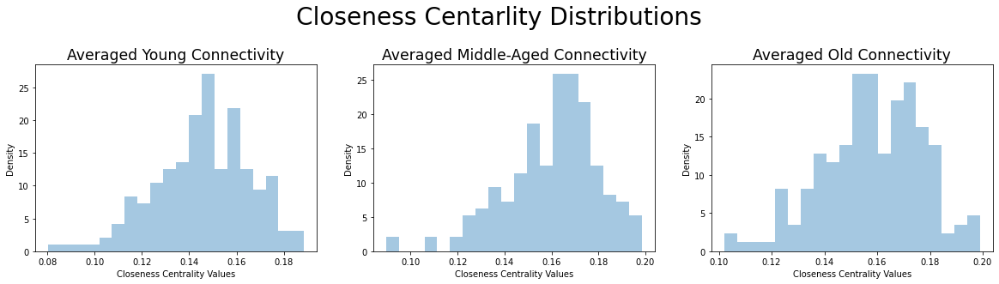

In [239]:
plt.figure(4, figsize=(20, 4))

plt.suptitle('Closeness Centarlity Distributions', fontsize=28, y=1.12)

################################################

#Young participants:
plt.subplot(1, 3, 1)

sns.distplot(list(y_close.values()), kde=False, norm_hist=True, bins=20)
plt.xlabel('Closeness Centrality Values')
plt.ylabel('Density')
plt.title('Averaged Young Connectivity', fontsize='xx-large')

################################################

#Mid-aged participants:
plt.subplot(1, 3, 2)

sns.distplot(list(m_close.values()), kde=False, norm_hist=True, bins=20)
plt.xlabel('Closeness Centrality Values')
plt.ylabel('Density')
plt.title('Averaged Middle-Aged Connectivity', fontsize='xx-large')

################################################

#Old participants:
plt.subplot(1, 3, 3)

sns.distplot(list(o_close.values()), kde=False, norm_hist=True, bins=20)
plt.xlabel('Closeness Centrality Values')
plt.ylabel('Density')
plt.title('Averaged Old Connectivity', fontsize='xx-large')

plt.savefig('./Figures/closeness_dists.pdf', format='pdf')

<b>Conclusion</b>: Similarly to the clustering coefficient, the middle-aged density is more skewed to higher values than the other age groups, suggesting a stronger connection between groups (triangles) of nodes.

## Path Lengths

### Shortest Path Lengths

We calculate the shortest path length between any two nodes in the network, which in a weighted graph is found by the minimum sum of the weights of connections between two given nodes.

In [273]:
#The shortest length for each node-node pair in the young network
yG_shortest_length_dict = {(e1, e2): nx.dijkstra_path_length(yG,
                                                             source=e1,
                                                             target=e2,
                                                             weight='distance')
                           for e1, e2 in yG.edges}

In [275]:
#The shortest length for each node-node pair in the mid-aged network
mG_shortest_length_dict = {(e1, e2): nx.dijkstra_path_length(mG,
                                                             source=e1,
                                                             target=e2,
                                                             weight='distance')
                           for e1, e2 in mG.edges}

In [276]:
#The shortest length for each node-node pair in the mid-aged network
oG_shortest_length_dict = {(e1, e2): nx.dijkstra_path_length(oG,
                                                             source=e1,
                                                             target=e2,
                                                             weight='distance')
                           for e1, e2 in oG.edges}

In [277]:
#We add these values as an attribute to the nodes
nx.set_edge_attributes(yG, yG_shortest_length_dict, 'shortest_distance')
nx.set_edge_attributes(mG, mG_shortest_length_dict, 'shortest_distance')
nx.set_edge_attributes(oG, oG_shortest_length_dict, 'shortest_distance')

We can average this measure across all possible pairs of nodes, giving the average shortest path length, which has the intuition of overall brain signal transportation efficiency.

In [278]:
avg_shortest_paths = [nx.average_shortest_path_length(yG, weight='distance'),
                     nx.average_shortest_path_length(mG, weight='distance'),
                     nx.average_shortest_path_length(oG, weight='distance')]

In [279]:
dict(
    zip(['Young avg shortest path', 'Mid avg shortest path', 'Old avg shortest path'],
        avg_shortest_paths))

{'Young avg shortest path': 7.010960976355935,
 'Mid avg shortest path': 6.340057583994564,
 'Old avg shortest path': 6.421979149039782}

<b>Conclusion</b>: The middle-aged connectivity networks have the lowest average shortest path, indicating that the brain signal efficiency peaks in this age bracket.

### Diameter $D$

The diameter $D$ is defined by:
$$ D := \max_{u,v \in V} d(u,v)$$
where $d$ is the shortest distance between nodes $u$ and $v$.

<b>Note</b>: The default NetworkX implementation of diameter does not include any option for edge weights in the distance calculation, so we do this manually using the shortest distance dictionaries found above.

In [280]:
dict(
    zip(['Young diameter', 'Mid diameter', 'Old diameter'], [
        max(yG_shortest_length_dict.values()),
        max(mG_shortest_length_dict.values()), 
        max(oG_shortest_length_dict.values())
    ]))

{'Young diameter': 17.115202698742515,
 'Mid diameter': 14.551206475003994,
 'Old diameter': 13.546277193478026}

<b>Conclusion</b>: Interestingly, this is not the same conclusion as the average shortest path. We find that this diameter is decreasing with age, indicating that although the average signal efficiency may be lower in the old age bracket, the most inefficient connections are optimised in the old age bracket.

# WSBMs

Now we have some comparative properties of the connectivity matrices of different ages, we can proceed to the main section of this project: detecting community structures of the brain by using an extended framework of the stochastic block model for weighted networks.

## Aggregating the Matrix Data

 Our Bayesian WSBM will be founded on the assumption that the edge weights are $\geq 0$, as this allows for a simpler likelihood function later on. Thus an essential step before we implement the Bayesian WSBM is that we take the absolute value of all entries of the adjacency matrices.
 
 <br>The next step is to aggregate the matrices from 177x177 to 44x44, as this avoids NaN problems with the likelihood later (due to too many inter/intra partition connections). We do this by:
<br>1) Removing the final row/column so the matrix is now 176x176, since 176 mod 4 = 0.
<br>2) Performing maximum aggregation on 4x4 blocks, which produces a 44x44 matrix.

<br>These two steps are done with the following function:

In [90]:
def matrix_aggregator(matrix):
    
    #Define the current length of matrix
    N_orig = matrix.shape[0]
    
    #Define the new length of the matrix
    N_new = int( (N_orig-1)/4 )
    
    #Remove the final row/column from the matrix
    matrix = matrix[0:-1,0:-1]
    
    #Change all edge weights to positive
    matrix_plus = abs(matrix)
    
    #Define the new matrix
    matrix_agg = np.zeros((N_new,N_new))
    
    #Now build the aggregated matrix iteratively
    for i in range(N_new):
        for j in range(N_new):
            
            #If i is not j, then add them up
            if i != j:
                matrix_agg[i,j] = matrix_plus[2*i:2*i+2, 2*j:2*j+2].sum()
            
            #If i equals j, this is a self loop which we don't permit, so set = np.nan
            else:
                matrix_agg[i,j] = np.nan
            
    #Return the aggregated matrix
    return matrix_agg

We now apply this function to our observed matrices:

### Young Matrix

In [91]:
y_matrix_agg = matrix_aggregator(y_matrix)

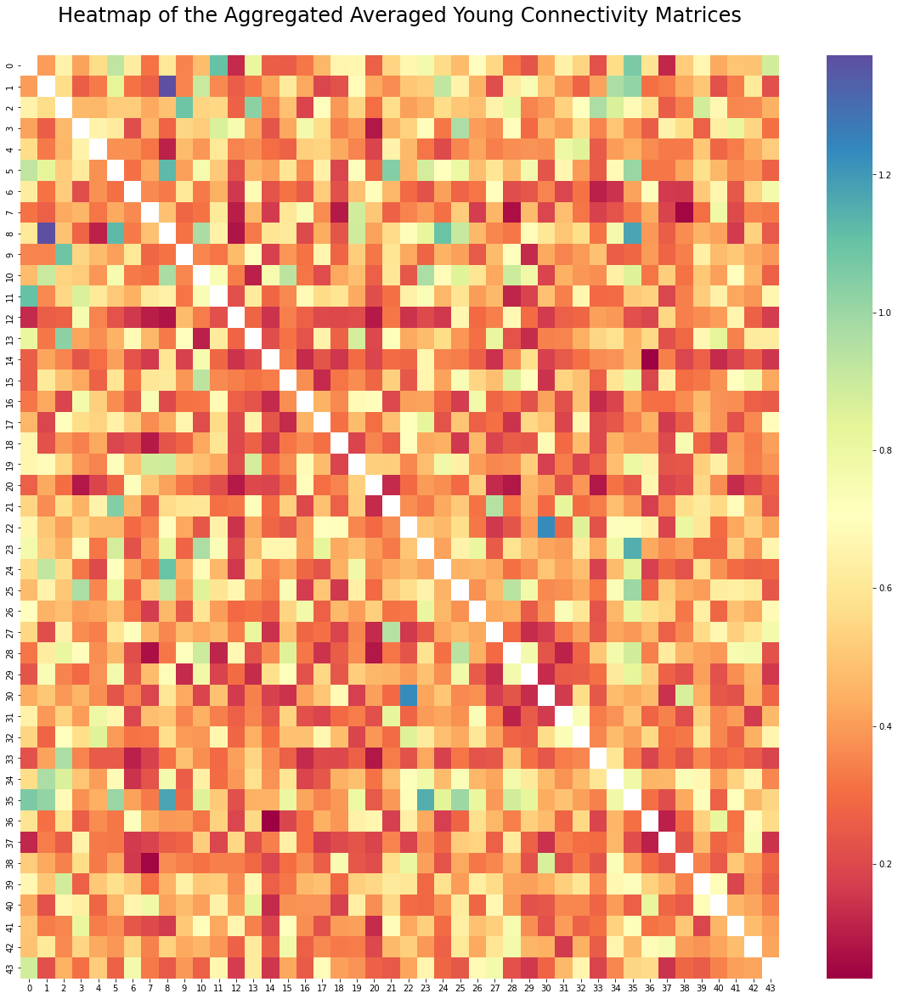

In [92]:
plt.figure(figsize=(20,20))
_ = sns.heatmap(y_matrix_agg,
                cmap='Spectral',
                cbar=True,
                square=False,
                mask=None) 

plt.title('Heatmap of the Aggregated Averaged Young Connectivity Matrices', y=1.03)
plt.savefig('./Figures/agg_young_avg_heatmap.pdf', format='pdf')

### Middle-Aged Matrix

In [93]:
m_matrix_agg = matrix_aggregator(m_matrix)

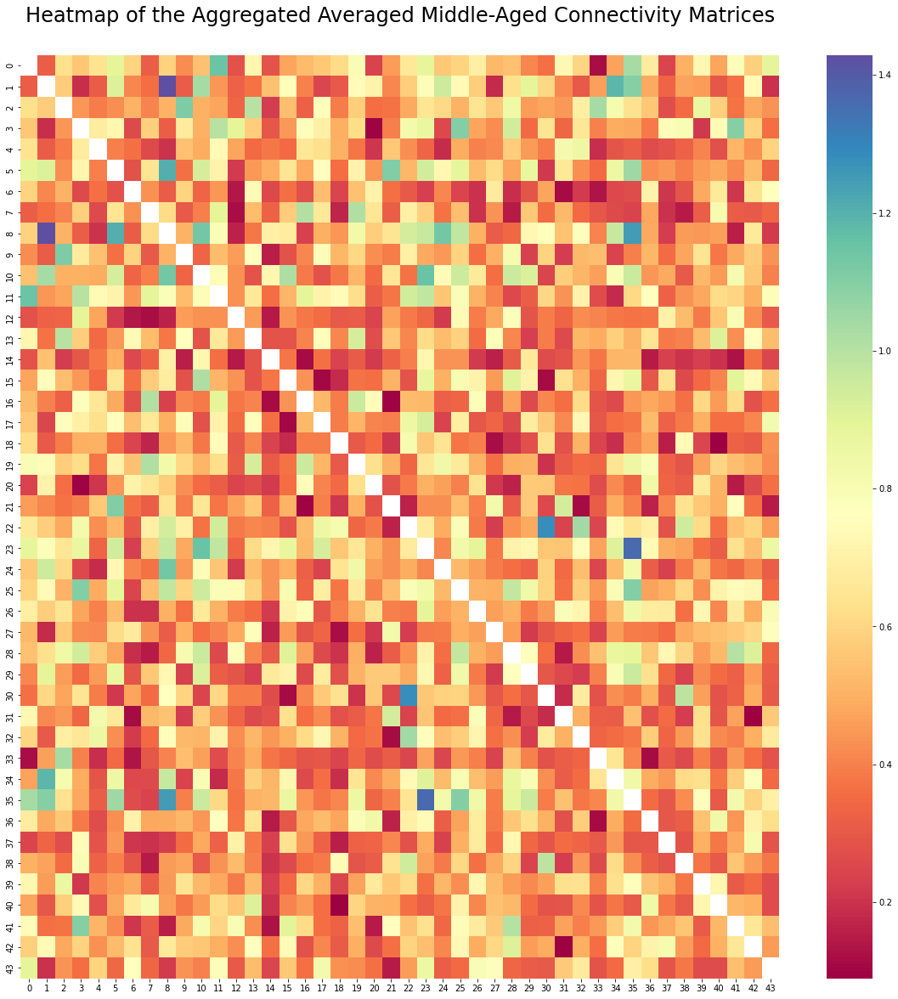

In [94]:
plt.figure(figsize=(20,20))
_ = sns.heatmap(m_matrix_agg,
                cmap='Spectral',
                cbar=True,
                square=False,
                mask=None) 

plt.title('Heatmap of the Aggregated Averaged Middle-Aged Connectivity Matrices', y=1.03)
plt.savefig('./Figures/agg_mid_avg_heatmap.pdf', format='pdf')

### Old Matrix

In [95]:
o_matrix_agg = matrix_aggregator(o_matrix)

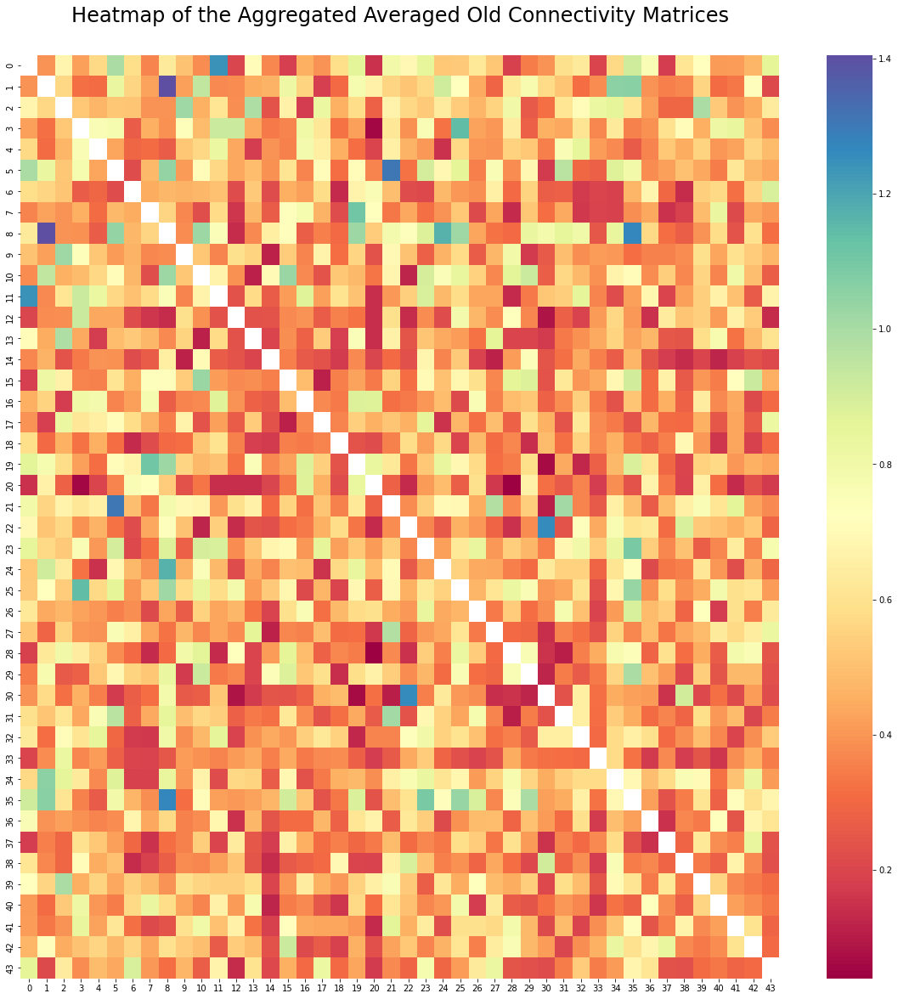

In [96]:
plt.figure(figsize=(20,20))
_ = sns.heatmap(o_matrix_agg,
                cmap='Spectral',
                cbar=True,
                square=False,
                mask=None) 

plt.title('Heatmap of the Aggregated Averaged Old Connectivity Matrices', y=1.03)
plt.savefig('./Figures/agg_old_avg_heatmap.pdf', format='pdf')

## Weighted Matrix Likelihood Function

This function will calculation the joint likelihood of the weights, given a partition vector $\vec{b}$ and parameters $\alpha, \beta >0$.

If $X_{r,s} = \{a_{ij} \: : \: (b_i,b_j)=(r,s)\}$ is the set of weights between nodes $i$ in partition $r$ and nodes $j$ in partition $s$, then we have likelihood:
$$ f(X_{r,s}|\vec{b},\alpha,\beta) = \frac{\Gamma(m_{rs}(X_{r,s})+\alpha)\beta^{\alpha}}{\Gamma(\alpha)(\mu_{rs}(X_{r,s})+\beta)^{m_{r,s}(X_{r,s})+\alpha}}$$
where:
$$ \mu_{rs}(X_{r,s}) = \sum_{i : b_i=r, \: j : b_j=s} \frac{x_{ij}}{1+\delta_{rs}} $$
counts the sum of the weights of connections between partitions $r$ and $s$ (but halves this when $r=s$ to avoid double counting by the handshaking lemma), and:
$$ m_{rs}(X_{r,s}) = \frac{\# \{b_i=r\}\cup \{b_j=s\}}{1+\delta_{rs}}$$
counts the number of members of partitions $r$ and $s$ (but halves this when $r=s$ for the same reason as above).

To keep the weights generally in the range $(0,1)$, we fix $\alpha=5$ and $\beta=1$, although these can be found via a MLE approach too.

In [98]:
#Define the length of the aggregated matrices to be N
N = y_matrix_agg.shape[0]

In [160]:
from scipy.special import gammaln as LogGamma
from scipy.special import gamma as Gamma
from scipy.stats import uniform

In [109]:
def partition_pair_weights_likelihood(matrix, b, alpha, beta, r, s):
    mu_rs = 0
    m_rs = 0
    
    #If r and s are different partitions, do not half the sums above
    if r != s:
        #Calculate mu and m
        for i in range(N):
            for j in range(N):
                #Check i and j belong to partitions r and s
                if b[i]==r and b[j]==s:
                    mu_rs += matrix[i,j]
                    m_rs += 1
    
    #If r and s are the same partition, half it
    else:
        #Calculate mu and m
        for i in range(N):
            for j in range(N):
                #Check i and j belong to partitions r and s
                if b[i]==r and b[j]==s:
                    mu_rs += matrix[i,j]/2
                    m_rs += 1/2
        
    #Calculate the likelihood, using a exp log trick to make the calculation more tractable:
    f = (beta**alpha) * np.exp(LogGamma(m_rs+alpha) - 
                               (LogGamma(alpha) + (m_rs+alpha)*np.log(mu_rs+beta)))
    
    return f, m_rs, mu_rs

We find typical values of $m_{rs}$ are 20-30, which is small enough for factorials to be done tractably.

By our working in the essay, as each partition pair $(r,s)$ is independent, the overall likelihood function is a product over all such $1 \leq r \leq s \leq B$, where $B$ is the number of partitions that we will find later using a Bayes factor.

In [110]:
def overall_weights_likelihood(matrix, b, B, alpha, beta):
    #We will be multiplying by f in each iteration, so start trivially with f=1
    f = 1
    
    #We iterate across all such r <= s
    for s in range(B):
        for r in range(s):
            #Multiply by the function above
            f *= partition_pair_weights_likelihood(matrix, b, alpha, beta, r, s)[0]
            
    return f

## Calculating the Optimal Partition Vector

As explained in the essay, the posterior of $\vec{b} \: | \: A$ is intractable due to the normalising constant, thus we use a MCMC method to find an optimal value $\vec{b}^*$. In particular, we use <b>Metropolis-Hastings<b>.

In [131]:
def partition_MCMC(matrix, B, alpha, beta):
    
    #Initialisation stage
    b = np.random.randint(B,size=N)
    t = 0
    
    #Set the execution time
    T = 500
    
    #Iterate the following
    for i in range(T):
        #Sample a new proposal partition vector uniformly
        b_next = np.random.randint(B,size=N)
        
        #Calculate the overall weights likelihood for each of b and b_next
        like = overall_weights_likelihood(matrix, b, B, alpha, beta)
        like_next = overall_weights_likelihood(matrix, b_next, B, alpha, beta)
        
        #Calculate the move probability
        prob = min(1, like_next/like)
        
        #Sample a random threshold value u
        u = uniform.rvs()
        
        #Accept or reject proposal based upon a and u
        if u <= prob:
            b = b_next
        
        #Update time for next iteration
        t += 1
        
    return b, like, like_next

## Finding an Appropriate Number of Partitions

We now seek a reasonable number of partitions, which can find using a Bayes factor approach (motivated by 'Learning Latent Block Structure in Weighted Networks' and 'Weighted Stochastic Block Models of the Human Connectome Across the Lifespan'. 

Given two partitions $B_1$ and $B_2$, the log Bayes factor is given by:

$$ \log(B_F(B_1,B_2)) = \log(f(A_{obs}|B_1,\vec{b}_{B_1}^*,\alpha,\beta) - \log(f(A_{obs}|B_2,\vec{b}_{B_2}^*,\alpha,\beta)$$

In the latter, they found $B=10$ to be optimal for >100 nodes, so in our context we expect B to be in the range 5-10. We iterate over all B to find the one which maximises the Bayes factor.

In [255]:
#This function will calculate not only the optimal number of partitions B, 
#but also the corresponding optimal partition vector of length B
def optimal_partition(matrix, alpha, beta):
    
    #Possible number of partitions
    B_range = [7,8,9,10,11,12]
    
    #Respective partition vectors and log likehoods of each model
    B_partitions = []
    B_likelihoods = []
    
    #Iterate over the partition numbers
    for B in B_range:
        
        #Find the optimal partition and likelihood
        b_optimal = partition_MCMC(matrix, B, alpha, beta)[0]
        like = overall_weights_likelihood(matrix, b_optimal, B, alpha, beta)
        
        #Calculate the log likelihoods
        log_like = np.log(like)
        
        #Add to the and partition and likelihoods list
        B_partitions.append(b_optimal)
        B_likelihoods.append(log_like)
        
    
    #Find the value of B that maximises the log likelihood
    idx = np.argmax(B_likelihoods)
    B_best = B_range[idx]
    b_optimal_best = B_partitions[idx]
    
    
    #Finally, return the optimal number of partitions
    return B_best, b_optimal_best

Let's calculate this for each aggregated matrix:

In [171]:
#Set parameters
alpha = 1
beta = 0.5

### Young Matrix Partition

In [392]:
y_partition_number, y_partition_vector = optimal_partition(
    y_matrix_agg, alpha, beta)

In [393]:
y_partition_number

7

In [394]:
y_partition_vector

array([5, 2, 1, 3, 6, 1, 6, 5, 1, 0, 5, 2, 5, 5, 4, 3, 2, 0, 4, 1, 4, 1,
       5, 1, 4, 5, 6, 5, 3, 1, 0, 2, 1, 1, 1, 1, 2, 5, 3, 2, 2, 3, 6, 6])

### Middle-Aged Matrix Partition

In [395]:
m_partition_number, m_partition_vector = optimal_partition(
    m_matrix_agg, alpha, beta)

In [396]:
m_partition_number

7

In [397]:
m_partition_vector

array([4, 6, 6, 0, 6, 5, 6, 1, 6, 4, 5, 6, 5, 1, 2, 5, 1, 3, 4, 6, 4, 2,
       6, 2, 3, 6, 6, 6, 2, 2, 6, 2, 3, 6, 3, 2, 3, 1, 1, 6, 0, 5, 6, 6])

### Old Matrix Partition

In [398]:
o_partition_number, o_partition_vector = optimal_partition(
    o_matrix_agg, alpha, beta)

In [399]:
o_partition_number

7

In [400]:
o_partition_vector

array([0, 6, 6, 1, 1, 0, 0, 0, 0, 0, 4, 0, 2, 3, 1, 0, 6, 4, 3, 0, 2, 0,
       1, 4, 1, 0, 5, 0, 1, 6, 3, 5, 4, 3, 1, 0, 1, 6, 2, 5, 6, 0, 2, 0])

It seems B=5 is the best number of partitions for all three matrices.

## Using This to Produce the Stochastic Block Form of the Observed Matrices

Now we have the optimal partition vectors for each matrix age group, we now need to create the block forms of each matrix, by rearranging nodes so they are alligned in consecutive order of the partitions.

In [278]:
def block_form(matrix, b_optimal, B):
    
    #Define the 'spots used up in each partition'
    k = np.zeros(B)
    
    #Define the lengths of each partition
    l = np.zeros(B)
    
    #Fill this zero array up with lengths
    for r in range(B):
        l[r] = sum(b == r for b in b_optimal)
        
    #Define new array indexing
    I = np.zeros(N)
    
    #Iterate over all nodes
    for i in range(N):
        
        if b_optimal[i] == 0:
            #Set new index
            I[i] = k[0]
            #Add one to the count
            k[0] += 1
            
        else:
            #Find total length up to this node
            total_length = 0
            
            for r in range(b_optimal[i]):
                total_length += l[r]
                
            #Set new index
            I[i] = total_length + k[b_optimal[i]]
            k[b_optimal[i]] += 1
            
    
    #Make sure the indices are integers
    I = I.astype(int)
    
    #Sort the matrix using new index
    matrix_sorted = matrix[:, I]
    matrix_sorted = matrix_sorted[I, :]
    
    return matrix_sorted, I

### Young Block Form

In [401]:
y_matrix_agg_block, y_idx = block_form(y_matrix_agg, y_partition_vector, y_partition_number)

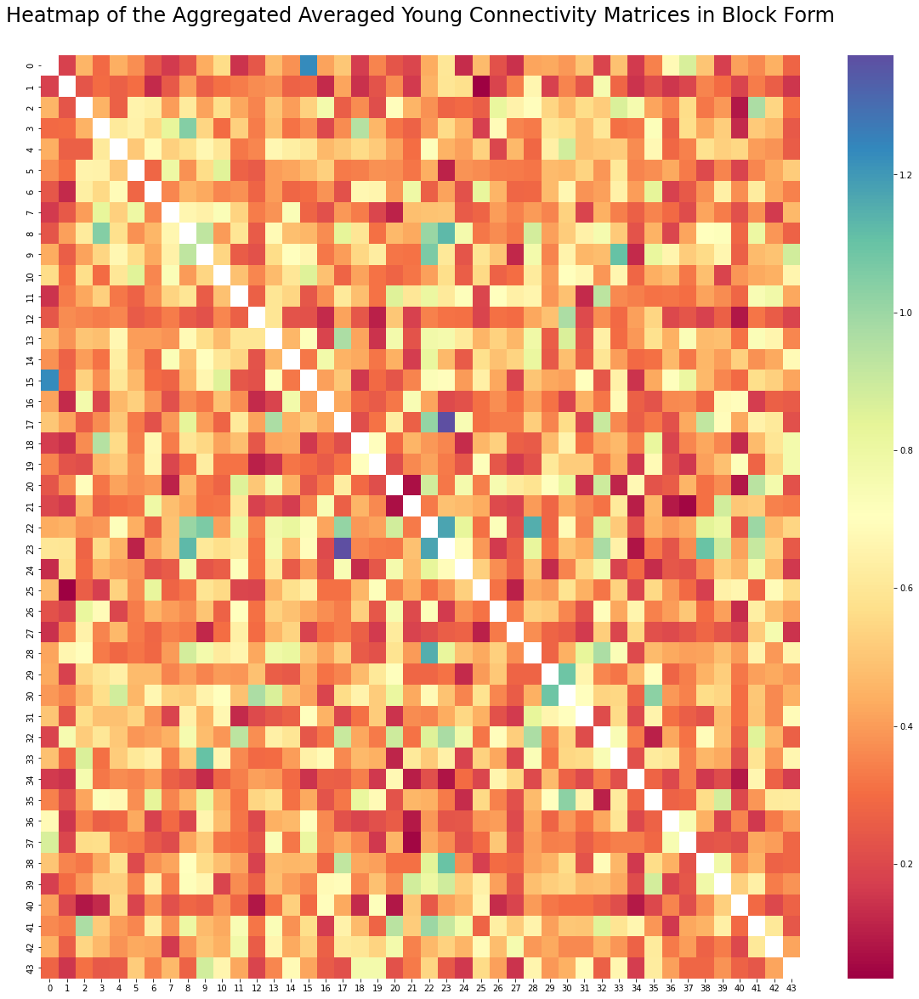

In [402]:
plt.figure(figsize=(20,20))
_ = sns.heatmap(y_matrix_agg_block,
                cmap='Spectral',
                cbar=True,
                square=False,
                mask=None) 

plt.title('Heatmap of the Aggregated Averaged Young Connectivity Matrices in Block Form', y=1.03)
plt.savefig('./Figures/agg_block_young_avg_heatmap.pdf', format='pdf')

### Middle-Aged Block Form

In [403]:
m_matrix_agg_block, m_idx = block_form(m_matrix_agg, m_partition_vector, m_partition_number)

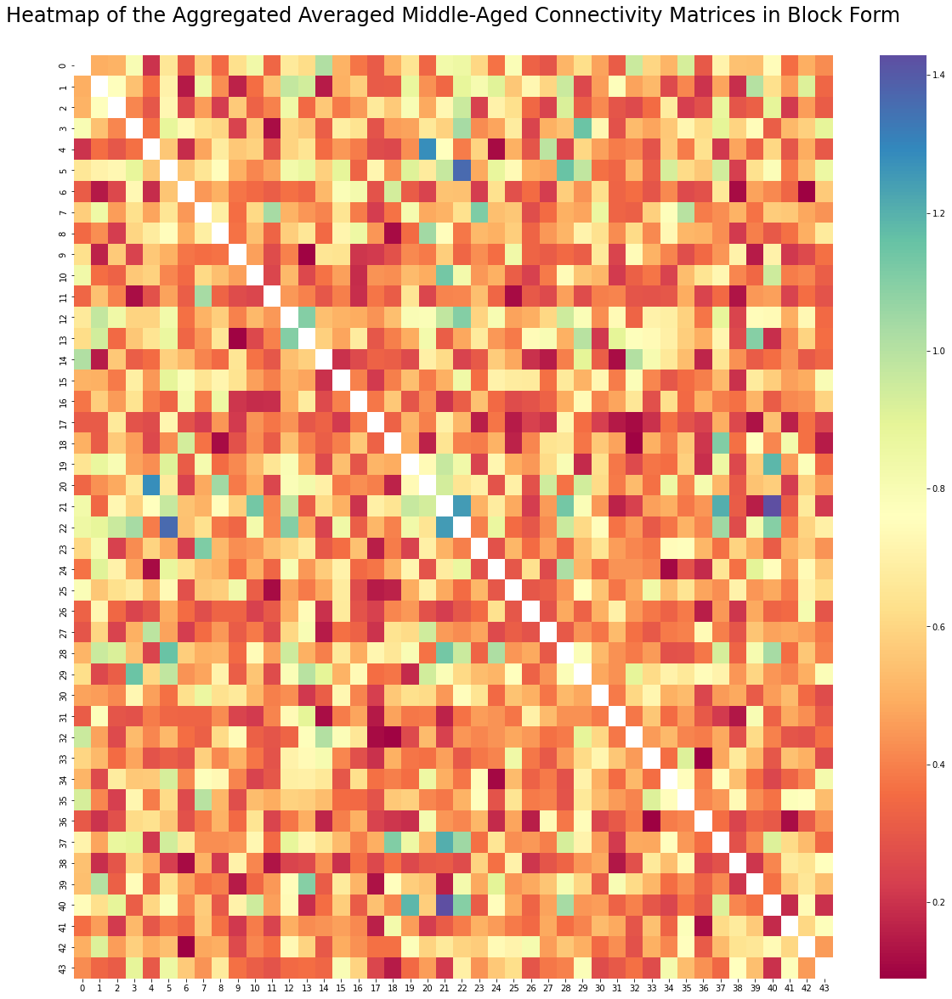

In [404]:
plt.figure(figsize=(20,20))
_ = sns.heatmap(m_matrix_agg_block,
                cmap='Spectral',
                cbar=True,
                square=False,
                mask=None) 

plt.title('Heatmap of the Aggregated Averaged Middle-Aged Connectivity Matrices in Block Form', y=1.03)
plt.savefig('./Figures/agg_block_mid_avg_heatmap.pdf', format='pdf')

### Old Block Form

In [405]:
o_matrix_agg_block, o_idx = block_form(o_matrix_agg, o_partition_vector, o_partition_number)

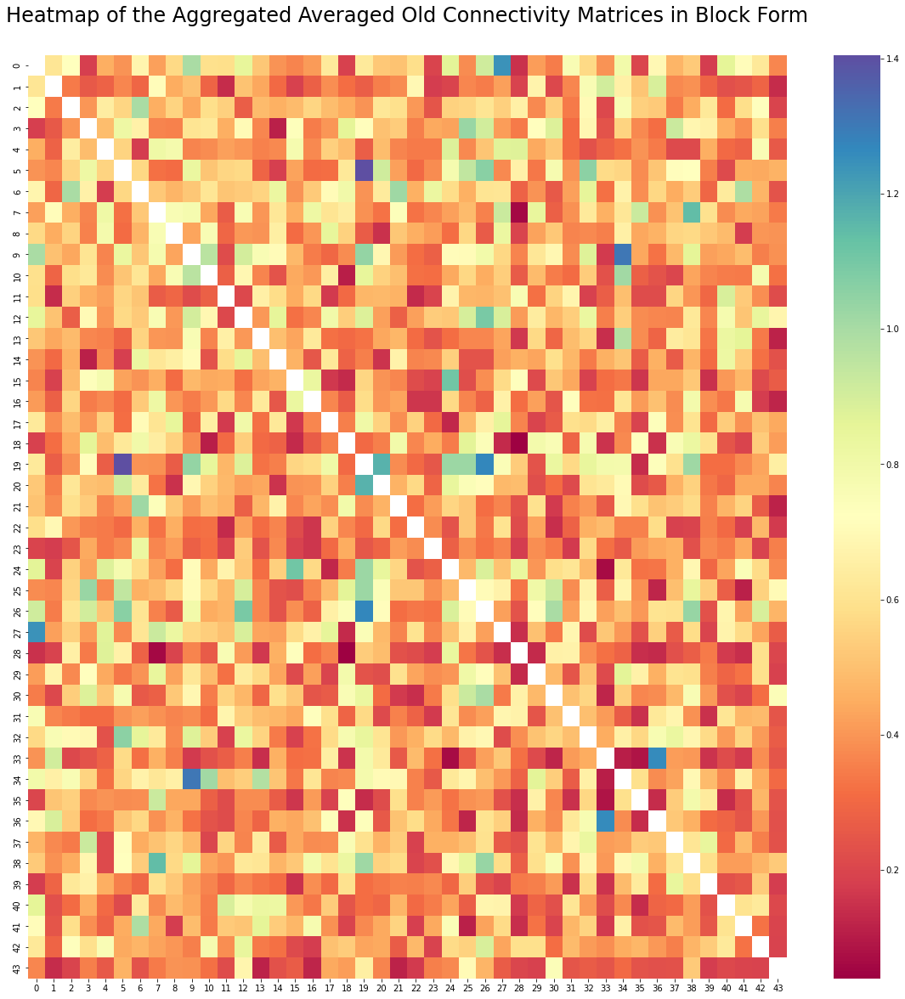

In [406]:
plt.figure(figsize=(20,20))
_ = sns.heatmap(o_matrix_agg_block,
                cmap='Spectral',
                cbar=True,
                square=False,
                mask=None) 

plt.title('Heatmap of the Aggregated Averaged Old Connectivity Matrices in Block Form', y=1.03)
plt.savefig('./Figures/agg_block_old_avg_heatmap.pdf', format='pdf')

# Comparing the WSBMs for Each Age

## Variation of Information

We measure the 'distance' between the block models by using variation of information (VI). In order to do this, we must compute the 'cluster sets' $C^{(k)}$ for each matrix $k$, which groups nodes are the same partition into a set. We then use these cluster sets to generate discrete probabilities $p_{r,s}^{(k,k')}$, $p_r^{(k)}$ and $p_s^{(k')}$ which can be used in the definition:
$$ \text{VI}(C^{(k)}, C^{(k')}) := \sum_{r,s=1}^B  p_{r,s}^{(k,k')} \log_2\left( \frac{p_{r,s}^{(k,k')}}{ p_r^{(k)} p_s^{(k')}}  \right) $$ 

where we take $\log_2(0) = 0$.

In [386]:
def variation_of_information(b_1, b_2, B):
    
    #Obtain the length of the partitions
    N = len(b_1)
    
    #Setup the cluster sets as empty sets
    C_1 = []
    C_2 = []
    
    #Generate the cluster sets
    for r in range(B):
        C_1.append( np.where(b_1 == r) )
        C_2.append( np.where(b_2 == r) )
        
    #Start sum at zero
    sigma = 0
    
    #Iteratively calculate the probabilities and sum them according to the VI definition
    for x in C_1:
        p = len(x)/N
        
        for y in C_2:
            q = len(y)/N
            
            j = len(np.intersect1d(x,y))/N
            
            #Only add to the sum if j is not zero, to avoid log problems
            if j > 0:
                sigma += j * (np.log2(j/p) + np.log2(j/q))
            
    return abs(sigma)

### Young vs Middle-Aged

In [407]:
VI_y_m = variation_of_information(b_1=y_partition_vector,
                         b_2=m_partition_vector,
                         B=y_partition_number)
VI_y_m

2.2670137718603276

### Young vs Old

In [408]:
VI_y_o = variation_of_information(b_1=y_partition_vector,
                         b_2=o_partition_vector,
                         B=y_partition_number)
VI_y_o

1.7438421807545579

### Middle-Aged vs Old

In [409]:
VI_m_o = variation_of_information(b_1=m_partition_vector,
                         b_2=o_partition_vector,
                         B=m_partition_number)
VI_m_o

2.1436936117604617

<b>Conclusion</b>: It seems that the average brain structures of the young and middle-aged individuals is the most different, whereas the average structure of the middle-aged and old individuals is the closest.
<br>It seems to be counter-intuitive that the average structure of the young and old individuals is not the most different. We justify this with the intuition that, as shown in the 'Network Measures' section, the average signal strength of connections is maximised for middle-aged individuals, and then decreases with the older individuals. Hence the young and old individuals share the property of weaker brain connections.

## Partition Vector Distributions

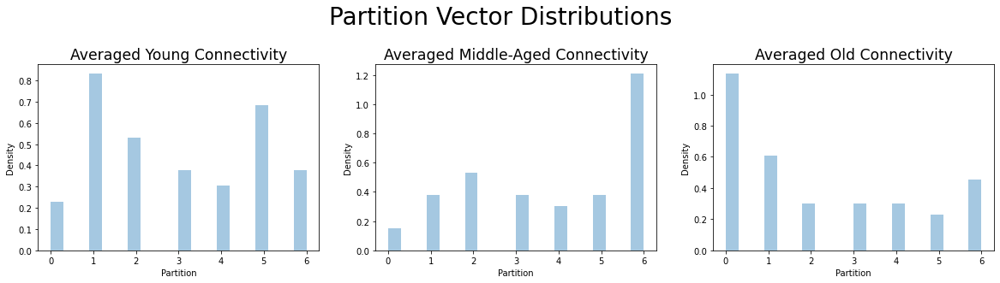

In [432]:
plt.figure(5, figsize=(20, 4))

plt.suptitle('Partition Vector Distributions', fontsize=28, y=1.12)

################################################

#Young participants:
plt.subplot(1, 3, 1)

sns.distplot(y_partition_vector, kde=False, norm_hist=True, bins=20)
plt.xlabel('Partition')
plt.ylabel('Density')
plt.title('Averaged Young Connectivity', fontsize='xx-large')

################################################

#Mid-aged participants:
plt.subplot(1, 3, 2)

sns.distplot(m_partition_vector, kde=False, norm_hist=True, bins=20)
plt.xlabel('Partition')
plt.ylabel('Density')
plt.title('Averaged Middle-Aged Connectivity', fontsize='xx-large')

################################################

#Old participants:
plt.subplot(1, 3, 3)

sns.distplot(o_partition_vector, kde=False, norm_hist=True, bins=20)
plt.xlabel('Partition')
plt.ylabel('Density')
plt.title('Averaged Old Connectivity', fontsize='xx-large')

plt.savefig('./Figures/partition_vector_dists.pdf', format='pdf')